In [2]:
# Import Plot.ly functions for both online/offline
import plotly.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
import plotly.tools as tls
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot

# Import extra modules as needed
import numpy as np
import pandas as pd

from dataChest import dataChest

init_notebook_mode()

from probeStationAnalysis import probeTest

In [97]:
def compareFiles(files, labels, die_list=None):
    """Builds a table showing the difference between files.  
    labels will be something like ('2m','30m') for dif bake times.  
    die_list filters the die that are displayed"""
    dataOrder = ('die', 'index', 'area', 'range', 'resistance')
    labels = ['_{}'.format(l) for l in labels]
    chest = dataChest(['fluxNoise_probe_station'])
    for i,l in enumerate(labels):
        chest.openDataset(files[i])
        dataset = pd.DataFrame([dict(zip(dataOrder,row)) for row in chest.getData()])
        if i==0:
            data = dataset
        else:
            data = pd.merge(data, dataset, how='outer', on=['die','index', 'area'], suffixes=('',l))
            data['Delta{}{}'.format(labels[0],l)] = data['resistance{}'.format(l)]/data['resistance']
    if die_list:
        data = data[data['die'].isin(die_list)]
    return data.style.hide_index().hide_columns(['range{}'.format(l) for l in ['']+labels])

B,C: wait 3 days  
B: ozone  
A,C,E: 130C for 30m  
D: 170C for 10m  

## Correct the file ##
Die E4 was measured twice.  The second measurement should be A4 instead.  Also, this should all be row 5, not row 4.

In [72]:
chest = dataChest(['fluxNoise_probe_station'])
chest.openDataset('ckc1632xhn_CW20190514A-Ox2_after3days.hdf5')
data = chest.getData()
params = {p:chest.getParameter(p) for p in chest.getParameterList()}
varList = chest.getVariables()
for row in data:
    row[0] = row[0][0]+'5'
    row[1] = np.uint8(row[1])
for row in data[-16:]:
    row[0] = 'A5'
    
## uncomment to actually write file
#chest.createDataset('CW20190514A-Ox2_after3days_corrected', *varList)
#chest.addData(data)
#for p in params.keys():
#    chest.addParameter(p, params[p])

## Base File ##

Mean R:   {0.0552: 5342.203184, 0.0414: 6892.036128, 0.0276: 10346.508177777778, 0.0138: 19558.749200000002}
Mean J_c:   {0.0552: 101.20780324023607, 0.0414: 104.59853250412033, 0.0276: 104.51306651975416, 0.0138: 110.57407468891407}
Theory:  {0.0552: 8033.768925938109, 0.0414: 10711.691901250811, 0.0276: 16067.537851876217, 0.0138: 32135.075703752434}
m = 0.00331779765757  b = 5.91956583627e-06  R_sub = 168931.308082


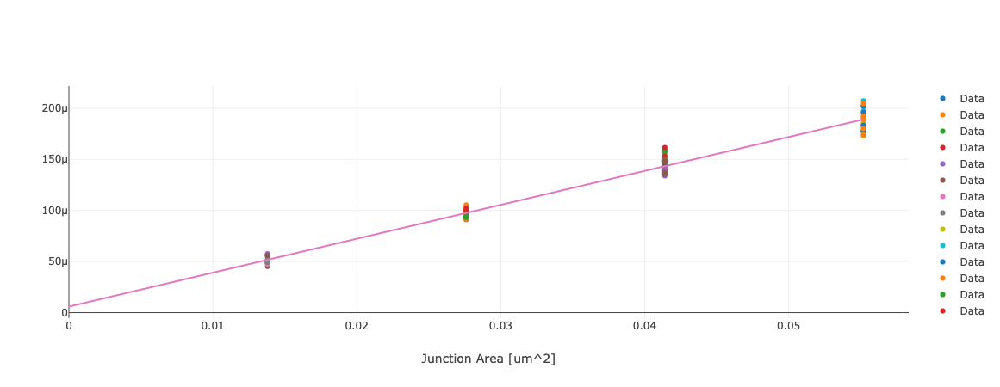

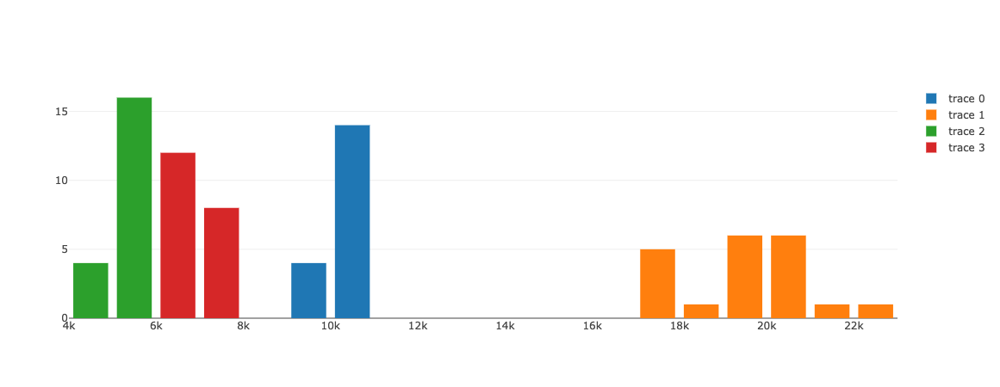

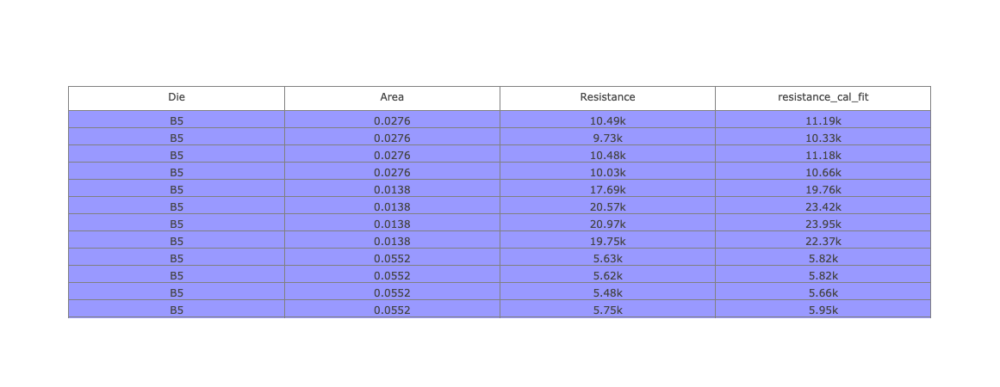

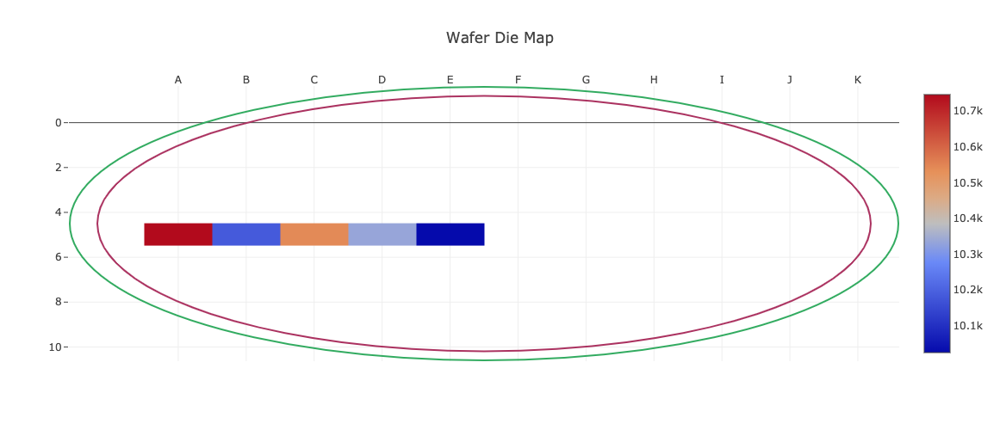

In [74]:
test = probeTest(['fluxNoise_probe_station','cqb2338dsd_CW20190514A-Ox2_after3days_corrected.hdf5'], bounds={276:(2000,12000), 138:(2000,200000), 552:(2000,200000), 414:(2000,200000)})#728:(-1,1)})

#test.removeOverwrittenData()
#test.addSubstrateCalibration(['fluxNoise','probe_station','cfx0221eva_CW20181211B-Open.hdf5'])
test.addSubstrateCalibrationFromFit()
for row in test.data:
    row['area'] = np.round(0.1*0.001*row['area'], 10)
print "Mean R:  ", test.meanR()
print "Mean J_c:  ", test.meanJc()
theoryR = test.theoreticalR(1e8*673e-9)
print "Theory: ", theoryR
test.resistancePlot()
test.resistanceHistogram()
test.displayDataTable()
test.dieMap()

## Wait 3 days ##

In [99]:
compareFiles(['cka0441oxi_CW20190514A-Ox2.hdf5', 'cqb2338dsd_CW20190514A-Ox2_after3days_corrected.hdf5'], ['0d','3d'], die_list=('B5','C5'))

area,die,index,resistance,resistance_3d,Delta_0d_3d
276,B5,0,10805.9,10493.4,0.971082
276,B5,1,10047.2,9732.31,0.968655
276,B5,2,10948,10483.3,0.957556
276,B5,3,10463.3,10027.3,0.958333
138,B5,4,19800.1,17693.1,0.893586
138,B5,5,22167.9,20569.5,0.927897
138,B5,6,22515,20973.1,0.931517
138,B5,7,20580.6,19753.7,0.95982
552,B5,8,5713.31,5630.63,0.985529
552,B5,9,5727.8,5624.95,0.982045


## Ozone treatment ##

In [102]:
compareFiles(['cqb2338dsd_CW20190514A-Ox2_after3days_corrected.hdf5', 'ckd1809bfu_CW20190514A-Ox2_afterOzone.hdf5'], 
             ['NoOz','Oz'], die_list=('B5',))

area,die,index,resistance,resistance_Oz,Delta_NoOz_Oz
276,B5,0,10493.4,11117.1,1.05944
276,B5,1,9732.31,10331.1,1.06152
276,B5,2,10483.3,11280.4,1.07604
276,B5,3,10027.3,421.095,0.0419949
138,B5,4,17693.1,386.585,0.0218495
138,B5,5,20569.5,482.31,0.0234478
138,B5,6,20973.1,428.703,0.0204406
138,B5,7,19753.7,527.284,0.0266929
552,B5,8,5630.63,5960.27,1.05854
552,B5,9,5624.95,5911.93,1.05102


## Bake 130C for 30m ##

In [105]:
compareFiles(['cqb2338dsd_CW20190514A-Ox2_after3days_corrected.hdf5', 'ckc2115dfa_CW20190514A-Ox2_after30m130C.hdf5'], 
             ['0m','30m'], die_list=('A5','C5','E5'))

area,die,index,resistance,resistance_30m,Delta_0m_30m
276,C5,0,10774.3,12454.5,1.15594
276,C5,1,10940,12874.3,1.17681
276,C5,2,10663.6,12460.3,1.1685
276,C5,3,9783.36,11575.3,1.18316
138,C5,4,18109.9,22503.3,1.2426
138,C5,5,22115.2,27180.9,1.22906
138,C5,6,21017.7,25165.8,1.19736
138,C5,7,19532.9,23558.7,1.2061
552,C5,8,5394.99,6094.49,1.12966
552,C5,9,4826.73,5613.74,1.16305


## Bake 170C for 10m ##

In [108]:
compareFiles(['cqb2338dsd_CW20190514A-Ox2_after3days_corrected.hdf5', 'ckc2206sam_CW20190514A-Ox2_after10m170C.hdf5'], 
             ['NoOz','Oz'], die_list=('D5',))

area,die,index,resistance,resistance_Oz,Delta_NoOz_Oz
276,D5,0,9990.96,12409.3,1.24205
276,D5,1,10283.5,12770.5,1.24184
276,D5,2,10729.1,13111.6,1.22206
276,D5,3,44624.7,31453.9,0.704853
138,D5,4,17655.9,24413.7,1.38275
138,D5,5,17952.9,23327.1,1.29935
138,D5,6,20116.4,25957.8,1.29038
138,D5,7,19940.5,25600.9,1.28387
552,D5,8,5394.53,6555.48,1.21521
552,D5,9,4938.59,6209.76,1.2574


Mean R:   {0.0552: 6454.96304, 0.0414: 8172.348, 0.0276: 12763.772266666667, 0.0138: 24824.8644}
Mean J_c:   {0.0552: 83.76076599745096, 0.0414: 88.21171895202941, 0.0276: 84.71988334164074, 0.0138: 87.11792177453098}
Theory:  {0.0552: 8033.768925938109, 0.0414: 10711.691901250811, 0.0276: 16067.537851876217, 0.0138: 32135.075703752434}
m = 0.00281095561938  b = 2.20093340795e-06  R_sub = 454352.683452


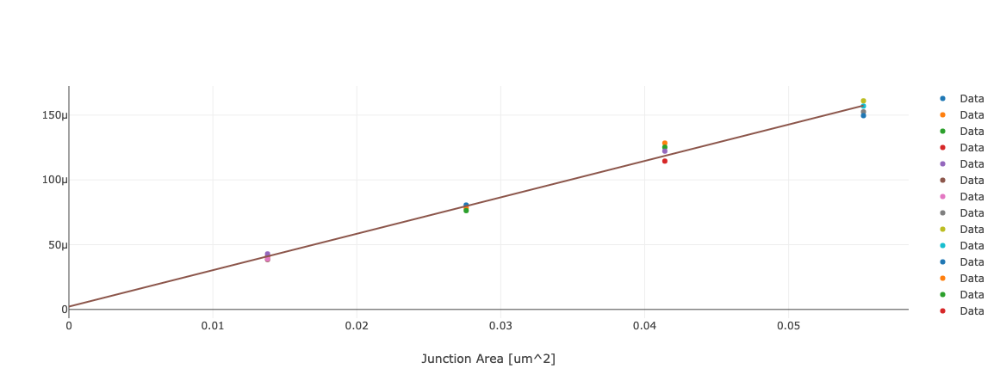

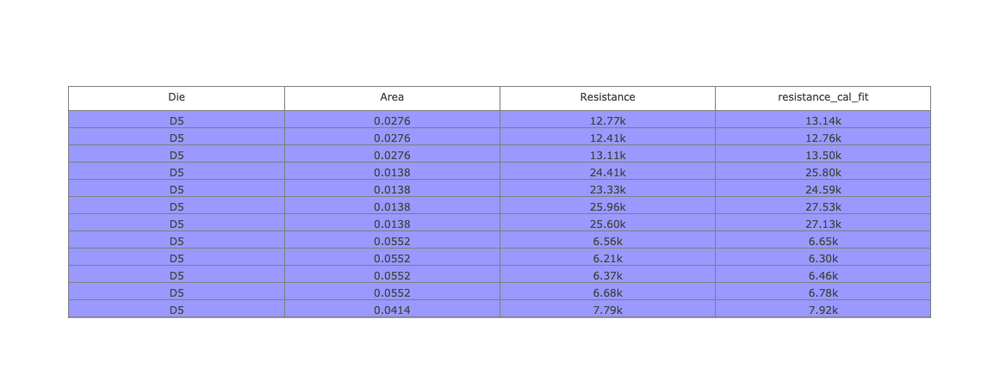

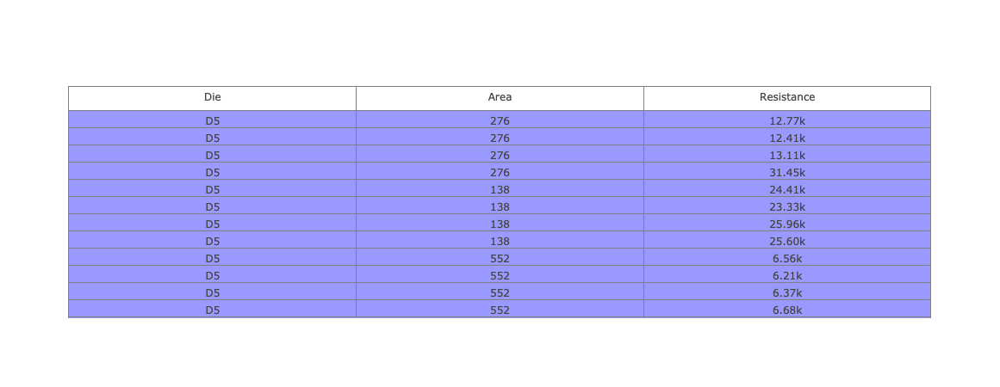

In [4]:
test = probeTest(['fluxNoise_probe_station','ckc2206sam_CW20190514A-Ox2_after10m170C.hdf5'], bounds={276:(2000,15000), 138:(2000,200000), 552:(2000,200000), 414:(2000,200000)})#728:(-1,1)})

#test.removeOverwrittenData()
#test.addSubstrateCalibration(['fluxNoise','probe_station','cfx0221eva_CW20181211B-Open.hdf5'])
test.addSubstrateCalibrationFromFit()
for row in test.data:
    row['area'] = np.round(0.1*0.001*row['area'], 10)
print "Mean R:  ", test.meanR()
print "Mean J_c:  ", test.meanJc()
theoryR = test.theoreticalR(1e8*673e-9)
print "Theory: ", theoryR
test.resistancePlot()
test.displayDataTable()
test = probeTest(['fluxNoise_probe_station','ckc2206sam_CW20190514A-Ox2_after10m170C.hdf5'], bounds={})#728:(-1,1)})
test.displayDataTable()